# Домашнее задание «Деревья решений»

In [58]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree


In [59]:
warnings.filterwarnings('ignore')

In [60]:
data = fetch_california_housing(as_frame=True)

In [61]:
X = data.data
y = data.target

In [62]:
print(data.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

In [63]:
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


Проверим данные на пропуски

In [64]:
X.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000


In [65]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   MedInc      20640 non-null  float64
 1   HouseAge    20640 non-null  float64
 2   AveRooms    20640 non-null  float64
 3   AveBedrms   20640 non-null  float64
 4   Population  20640 non-null  float64
 5   AveOccup    20640 non-null  float64
 6   Latitude    20640 non-null  float64
 7   Longitude   20640 non-null  float64
dtypes: float64(8)
memory usage: 1.3 MB


In [66]:
y.hasnans

False

Построим матрицу корреляции

<AxesSubplot:>

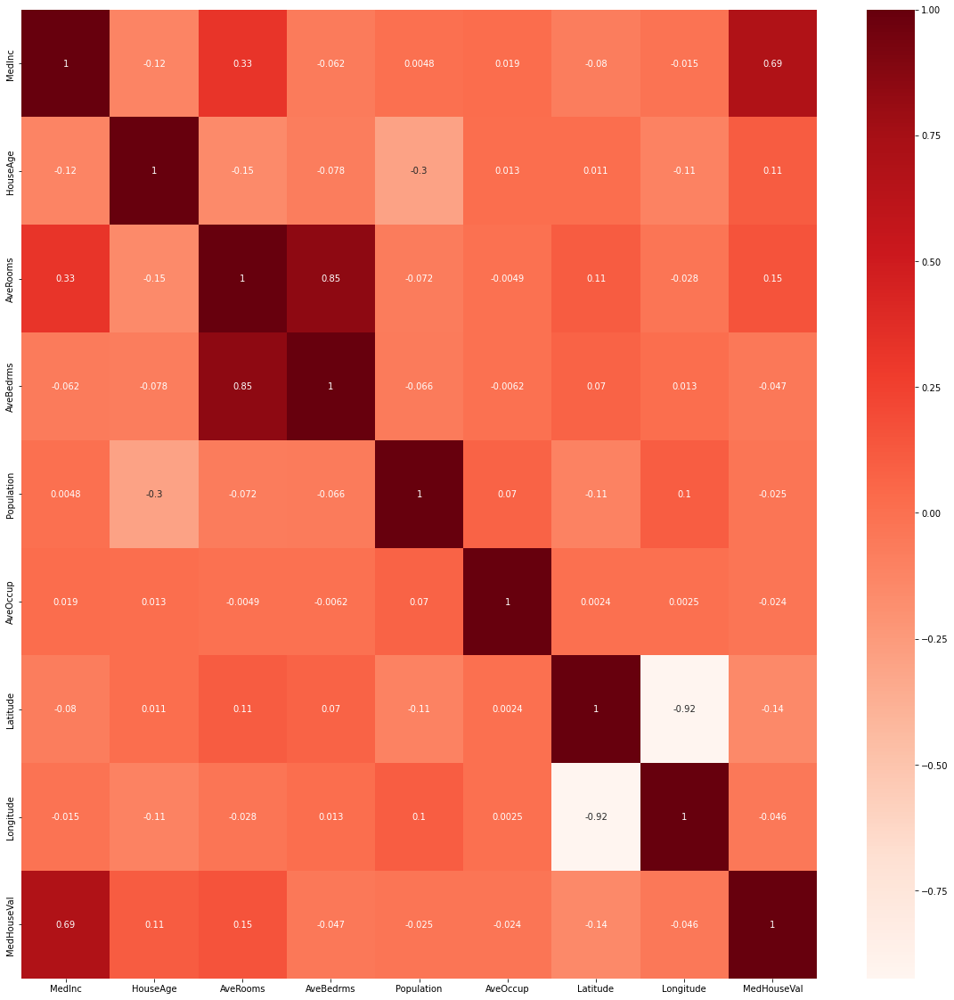

In [67]:
data = X.copy()
data['MedHouseVal'] = y
sns.heatmap(data.corr(), cmap="Reds", annot=True)

Видим сильную корреляцию признаков `AveBedrms` и `AveRooms`

Text(0.5, 1.0, 'Longitude')

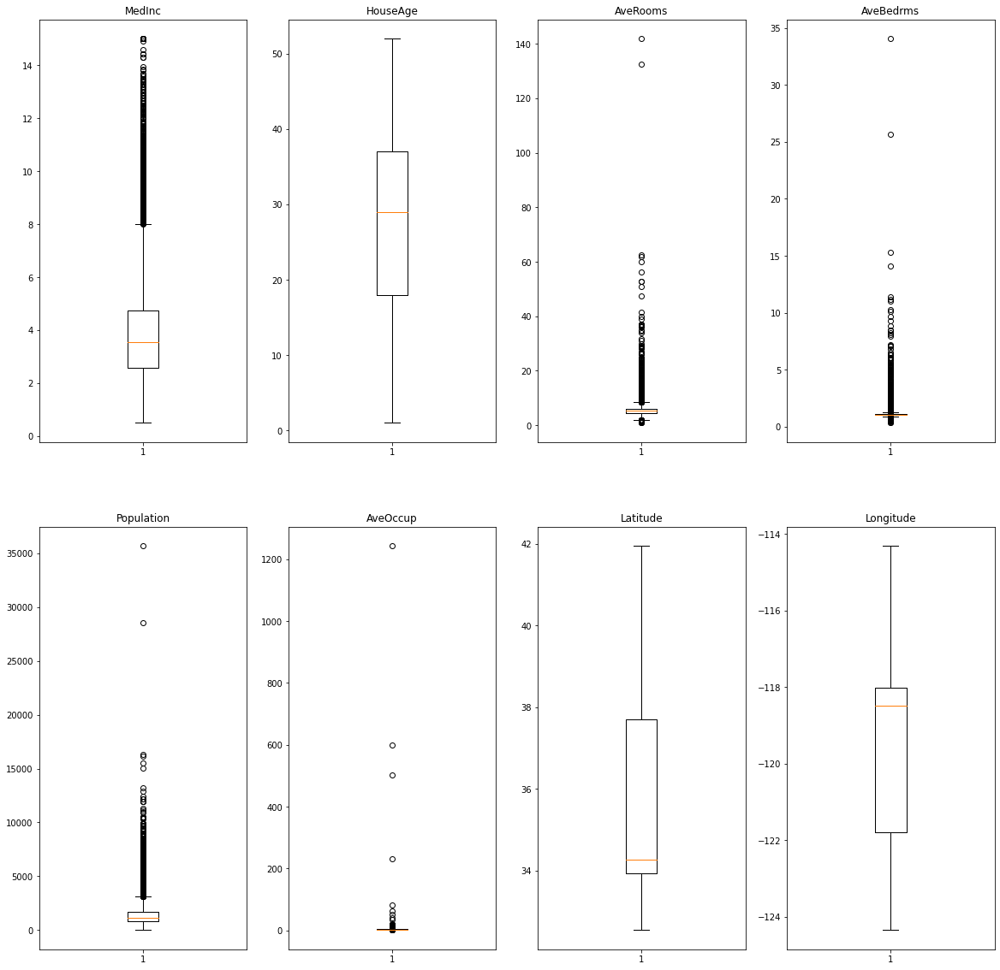

In [68]:
plt.rcParams['figure.figsize'] = 20,20

fig, axs = plt.subplots(2,4)
axs[0,0].boxplot(X['MedInc'])
axs[0,0].set_title('MedInc')
axs[0,1].boxplot(X['HouseAge'])
axs[0,1].set_title('HouseAge')
axs[0,2].boxplot(X['AveRooms'])
axs[0,2].set_title('AveRooms')
axs[0,3].boxplot(X['AveBedrms'])
axs[0,3].set_title('AveBedrms')
axs[1,0].boxplot(X['Population'])
axs[1,0].set_title('Population')
axs[1,1].boxplot(X['AveOccup'])
axs[1,1].set_title('AveOccup')
axs[1,2].boxplot(X['Latitude'])
axs[1,2].set_title('Latitude')
axs[1,3].boxplot(X['Longitude'])
axs[1,3].set_title('Longitude')

Удаляем признак `AveBedrms`.


In [69]:
X.drop(columns=['AveBedrms'])

,MedInc,HouseAge,AveRooms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,565.0,2.181467,37.85,-122.25
...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,845.0,2.560606,39.48,-121.09
20636,2.5568,18.0,6.114035,356.0,3.122807,39.49,-121.21
20637,1.7000,17.0,5.205543,1007.0,2.325635,39.43,-121.22
20638,1.8672,18.0,5.329513,741.0,2.123209,39.43,-121.32


### Линейная регрессия

In [70]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
lr_model = make_pipeline(StandardScaler(), LinearRegression())
lr_model.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression())])

In [71]:
lr_model.score(X_train, y_train)

0.6088968118672871

In [72]:
lr_model.score(X_test, y_test)

0.5943232652466204

### Дерево решений

In [73]:
dt_model = DecisionTreeRegressor(random_state=0)
dt_model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=0)

In [74]:
dt_model.score(X_train, y_train)

1.0

In [75]:
dt_model.score(X_test, y_test)

0.5924304824636766

Видно, что модель сильно переобучилась

Отобразим часть графа дерева

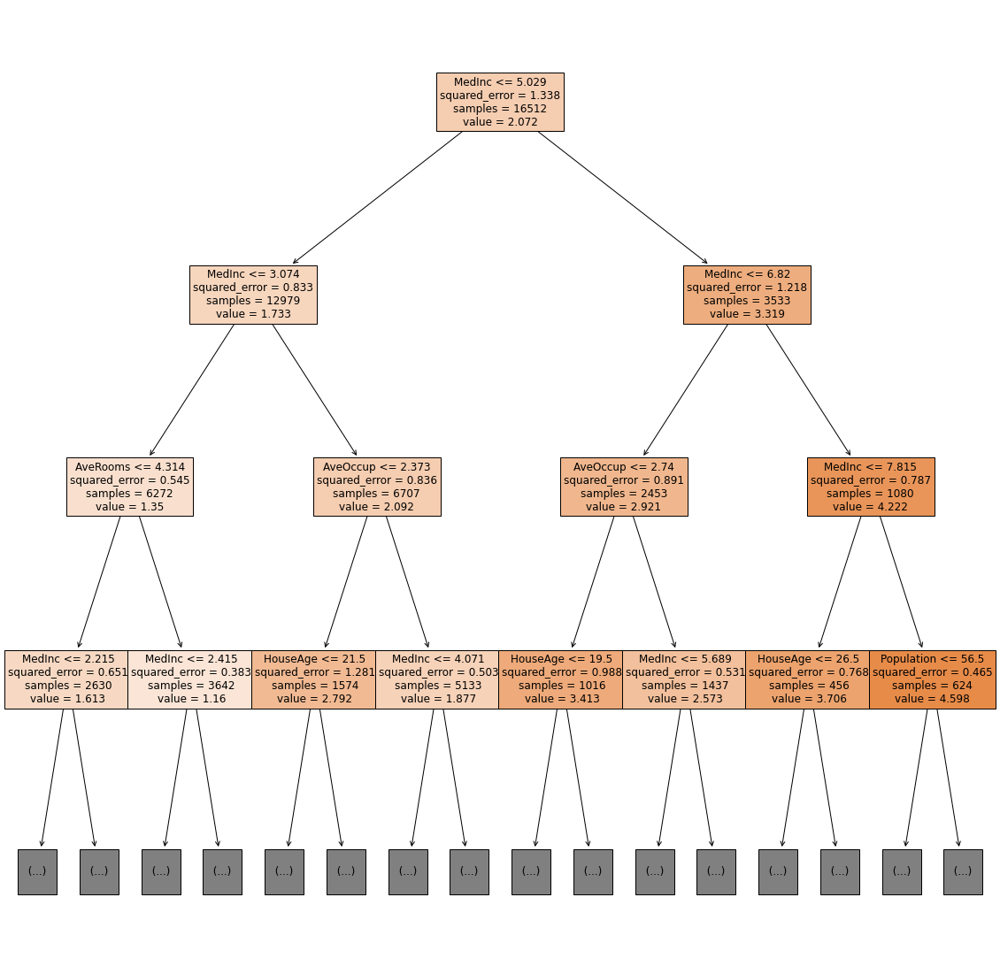

In [76]:
plt.figure(figsize=(20,20))
_ = tree.plot_tree(dt_model, feature_names=X.columns, filled=True, max_depth=3, fontsize=12)

In [77]:
!pip install dtreeviz

In [78]:
from dtreeviz.trees import dtreeviz
viz = dtreeviz(dt_model, X, y, target_name="MedHouseVal", feature_names=X.columns, depth_range_to_display=(0,2), scale=2)
viz

Попробуем уменьшить глубину дерева

In [79]:
dt_model = DecisionTreeRegressor(max_depth=7, random_state=0)
dt_model.fit(X_train, y_train)
dt_model.score(X_train, y_train)

0.7139939479232886

In [80]:
dt_model.score(X_test, y_test)

0.6474580599597188

Видим явное улучшение показателей

Попробуем увеличить количество сэмплов для образования листа

In [81]:
dt_model = DecisionTreeRegressor(min_samples_leaf=15, random_state=0)
dt_model.fit(X_train, y_train)
dt_model.score(X_train, y_train)

0.8295308873221057

In [82]:
dt_model.score(X_test, y_test)

0.7204360112921111

Видим существенное улучшение качества модели

### Выводы

В целом дерево лучше справляется с задачей регрессии, однако требует точной настройки гиперпараметров (не работает "из коробки")

| Модель                                      | train score        | test score         |
|---------------------------------------------|--------------------|--------------------|
| LinearRegression                            | 0.6088968118672871 | 0.5943232652466202 |
| DecisionTreeRegressor                       | 1.0                | 0.5848802997471263 |
| DecisionTreeRegressor max_depth = 7         | 0.7131928087001072 | 0.6511263349695376 |
| DecisionTreeRegressor min_samples_leaf = 15 | 0.8286358939853266 | 0.7131347640950726 |